<a href="https://colab.research.google.com/github/JayanthGarikapati/project-1/blob/main/sragan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import cv2
import numpy as np
import pandas as pd
import os, math, sys
import glob, itertools
import argparse, random

import torch
import torch.nn as nn

import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.models import vgg19
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image, make_grid

import plotly
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm_notebook as tqdm
from sklearn.model_selection import train_test_split

random.seed(42)
import warnings
warnings.filterwarnings("ignore")

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

0

In [ ]:
# load pretrained models
load_pretrained_models = True
# number of epochs of training
n_epochs = 5
# name of the dataset
dataPathCanonTrain = '/content/gdrive/MyDrive/images'
dataPathCanonTest = '/content/gdrive/MyDrive/images'
dataPathNikonTrain = '/content/gdrive/MyDrive/images'
dataPathNikonTest = '/content/gdrive/MyDrive/images*'
# size of the batches
batch_size = 16
# adam: learning rate
lr = 0.00008
# adam: decay of first order momentum of gradient
b1 = 0.5
# adam: decay of second order momentum of gradient
b2 = 0.999
# epoch from which to start lr decay
decay_epoch = 100
# number of cpu threads to use during batch generation
n_cpu = 8
# high res. image height
hr_height = 256
# high res. image width
hr_width = 256
# number of image channels
channels = 3

os.makedirs("images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

cuda = torch.cuda.is_available()
hr_shape = (hr_height, hr_width)

In [ ]:
trainCanonDataHR = []
trainCanonDataLR = []
i = 0
for image in glob.iglob(f'{dataPathCanonTrain}/*'):
    if image.split('_')[-1] == 'HR.png':
        trainCanonDataHR.append(image)
    else:
        trainCanonDataLR.append(image)

testCanonDataHR = []
testCanonDataLR = []
i = 0
for image in glob.iglob(f'{dataPathCanonTest}/*'):
    if image.split('_')[-1] == 'HR.png':
        testCanonDataHR.append(image)
    else:
        testCanonDataLR.append(image)
trainNikonDataHR = []
trainNikonDataLR = []
i = 0
for image in glob.iglob(f'{dataPathNikonTrain}/*'):
    if image.split('_')[-1] == 'HR.png':
        trainNikonDataHR.append(image)
    else:
        trainNikonDataLR.append(image)

testNikonDataHR = []
testNikonDataLR = []
i = 0
for image in glob.iglob(f'{dataPathNikonTest}/*'):
    if image.split('_')[-1] == 'HR.png':
        testNikonDataHR.append(image)
    else:
        testNikonDataLR.append(image)
trainDataHR = trainCanonDataHR + trainNikonDataHR
trainDataLR = trainCanonDataLR + trainNikonDataLR

# Merging Canon and Nikon test

testDataHR = testCanonDataHR + testNikonDataHR
testDataLR = testCanonDataLR + testNikonDataLR
print(len(trainCanonDataLR))
print(len(testCanonDataLR))

13
13


In [ ]:
# Normalization parameters for pre-trained PyTorch models
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

class ImageDataset(Dataset):
    def __init__(self, files, hr_shape):
        hr_height, hr_width = hr_shape
        # Transforms for low resolution images and high resolution images
        self.lr_transform = transforms.Compose(
            [
                transforms.Resize((hr_height // 4, hr_height // 4), Image.BICUBIC),
                transforms.ToTensor(),
                transforms.Normalize(mean, std),
            ]
        )
        self.hr_transform = transforms.Compose(
            [
                transforms.Resize((hr_height, hr_height), Image.BICUBIC),
                transforms.ToTensor(),
                transforms.Normalize(mean, std),
            ]
        )
        self.files = files
        print(len(files))

    def __getitem__(self, index):
        img = Image.open(self.files[index % len(self.files)])

        img_lr = self.lr_transform(img)
        img_hr = self.hr_transform(img)

        return {"lr": img_lr, "hr": img_hr}

    def __len__(self):
        return len(self.files)

In [ ]:
# train_paths, test_paths = train_test_split(sorted(glob.glob(dataset_path + "/*.*")), test_size=0.02, random_state=42)
train_dataloader = DataLoader(ImageDataset(trainCanonDataLR, hr_shape=hr_shape), batch_size= batch_size, shuffle=True, num_workers=n_cpu)
test_dataloader = DataLoader(ImageDataset(testCanonDataLR, hr_shape=hr_shape), batch_size= batch_size, shuffle=True, num_workers=n_cpu)

13
13


In [ ]:
for img in testCanonDataLR[:5]:
    imgCV = cv2.imread(img)
    print(imgCV.shape)

(218, 178, 3)
(218, 178, 3)
(218, 178, 3)
(218, 178, 3)
(218, 178, 3)


In [ ]:
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        vgg19_model = vgg19(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(vgg19_model.features.children())[:18])

    def forward(self, img):
        return self.feature_extractor(img)


class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
            nn.PReLU(),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
        )

    def forward(self, x):
        return x + self.conv_block(x)


class GeneratorResNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_residual_blocks=16):
        super(GeneratorResNet, self).__init__()

        # First layer
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels, 64, kernel_size=9, stride=1, padding=4), nn.PReLU())

        # Residual blocks
        res_blocks = []
        for _ in range(n_residual_blocks):
            res_blocks.append(ResidualBlock(64))
        self.res_blocks = nn.Sequential(*res_blocks)

        # Second conv layer post residual blocks
        self.conv2 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64, 0.8))

        # Upsampling layers
        upsampling = []
        for out_features in range(2):
            upsampling += [
                # nn.Upsample(scale_factor=2),
                nn.Conv2d(64, 256, 3, 1, 1),
                nn.BatchNorm2d(256),
                nn.PixelShuffle(upscale_factor=2),
                nn.PReLU(),
            ]
        self.upsampling = nn.Sequential(*upsampling)

        # Final output layer
        self.conv3 = nn.Sequential(nn.Conv2d(64, out_channels, kernel_size=9, stride=1, padding=4), nn.Tanh())

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = torch.add(out1, out2)
        out = self.upsampling(out)
        out = self.conv3(out)
        return out


class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2 ** 4), int(in_width / 2 ** 4)
        self.output_shape = (1, patch_h, patch_w)

        def discriminator_block(in_filters, out_filters, first_block=False):
            layers = []
            layers.append(nn.Conv2d(in_filters, out_filters, kernel_size=3, stride=1, padding=1))
            if not first_block:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            layers.append(nn.Conv2d(out_filters, out_filters, kernel_size=3, stride=2, padding=1))
            layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        layers = []
        in_filters = in_channels
        for i, out_filters in enumerate([64, 128, 256, 512]):
            layers.extend(discriminator_block(in_filters, out_filters, first_block=(i == 0)))
            in_filters = out_filters

        layers.append(nn.Conv2d(out_filters, 1, kernel_size=3, stride=1, padding=1))

        self.model = nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

In [ ]:
# Initialize generator and discriminator
generator = GeneratorResNet()
discriminator = Discriminator(input_shape=(channels, *hr_shape))
feature_extractor = FeatureExtractor()

# Set feature extractor to inference mode
feature_extractor.eval()

# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_content = torch.nn.L1Loss()

if cuda:
    generator = generator.cuda()
    discriminator = discriminator.cuda()
    feature_extractor = feature_extractor.cuda()
    criterion_GAN = criterion_GAN.cuda()
    criterion_content = criterion_content.cuda()



# Optimizers

optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

Training Epoch 0 :   0%|          | 0/1 [00:00<?, ?it/s]

Testing Epoch 0 :   0%|          | 0/1 [00:00<?, ?it/s]

HR shape torch.Size([13, 3, 256, 256])
LR shape torch.Size([13, 3, 64, 64])
G shape torch.Size([13, 3, 256, 256])
(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


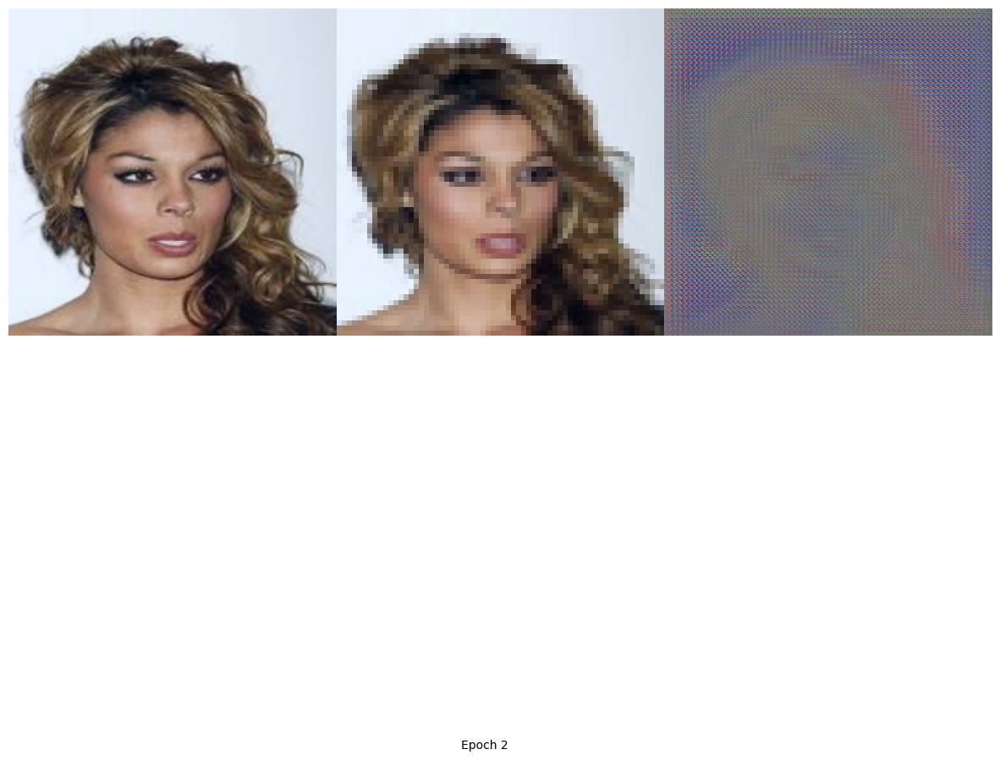

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


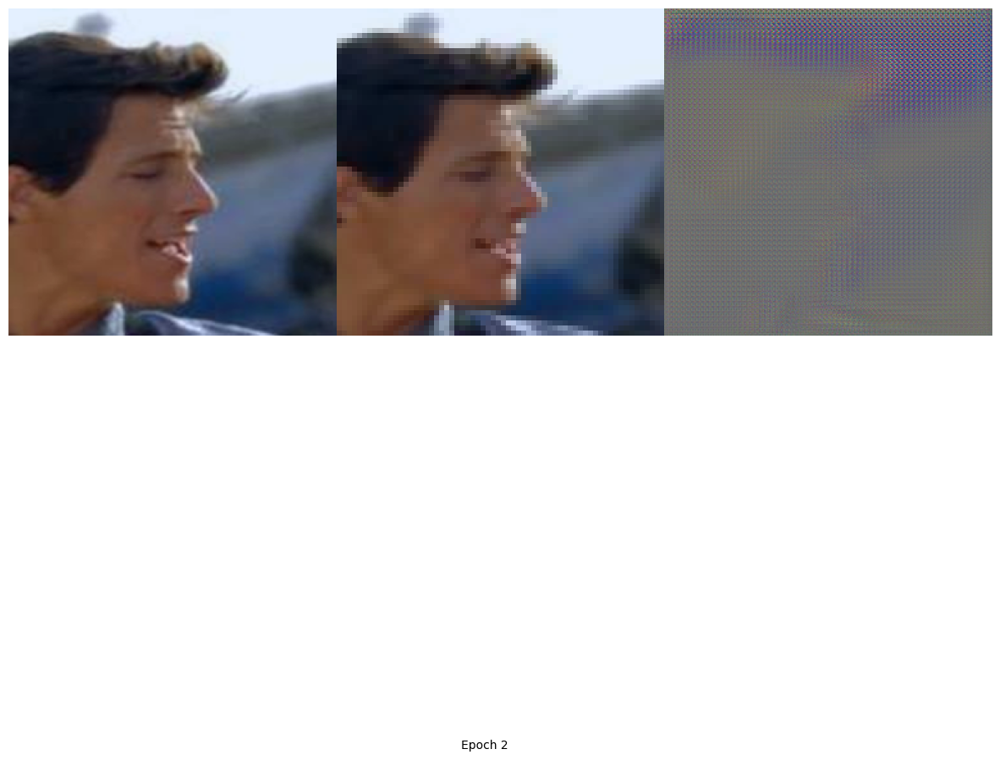

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


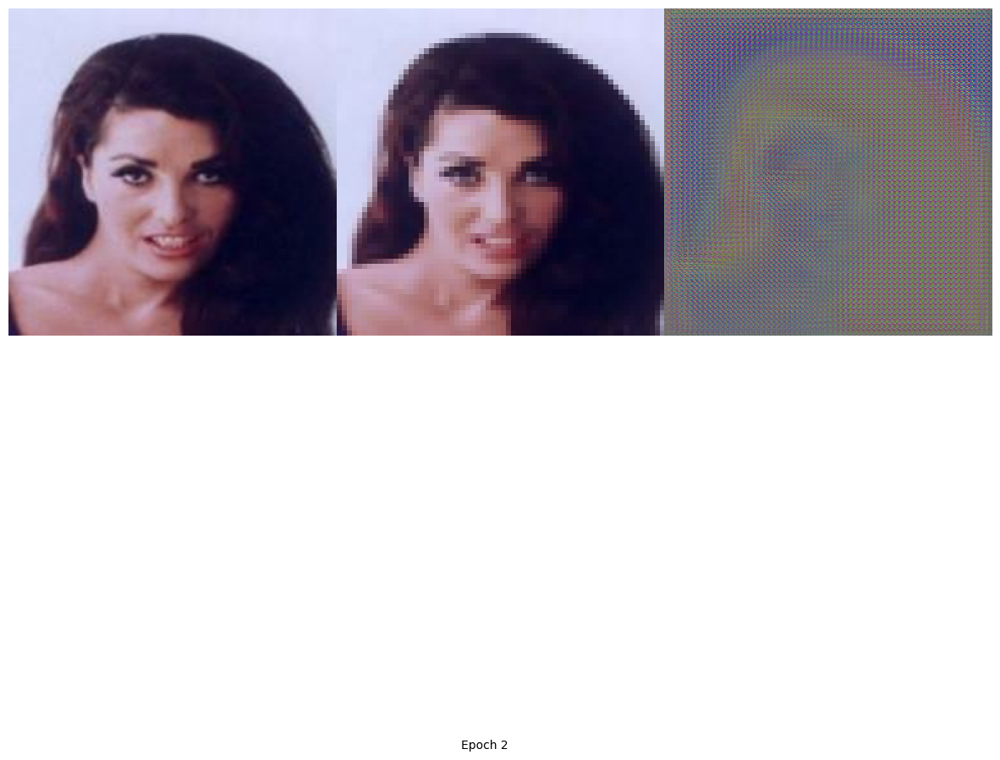

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


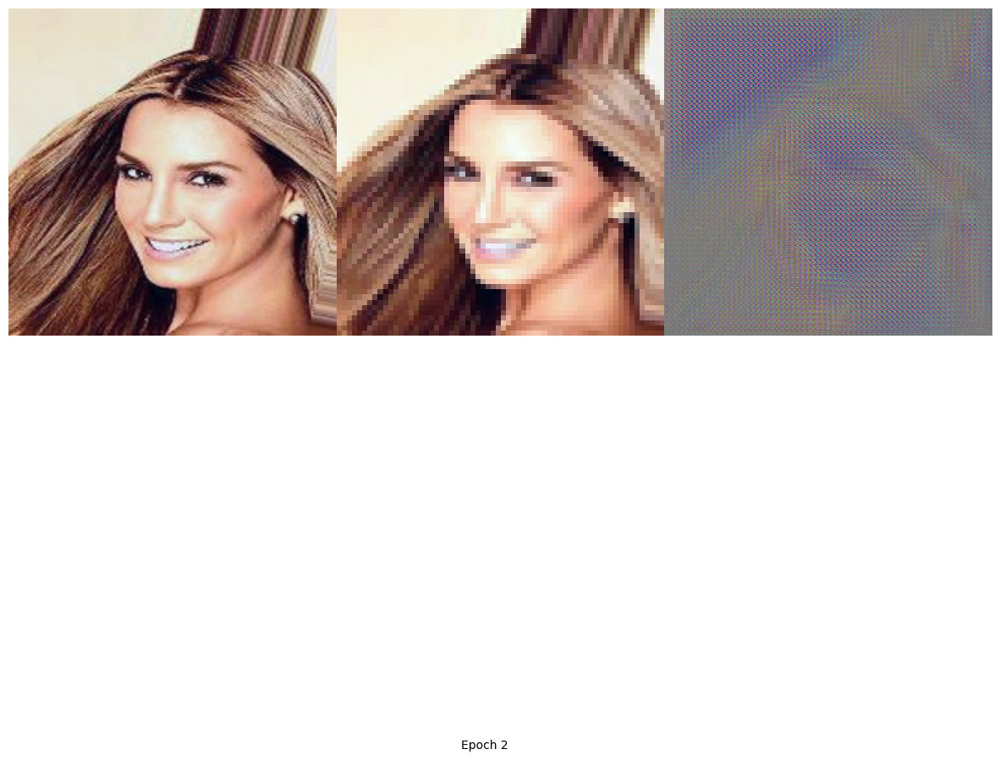

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


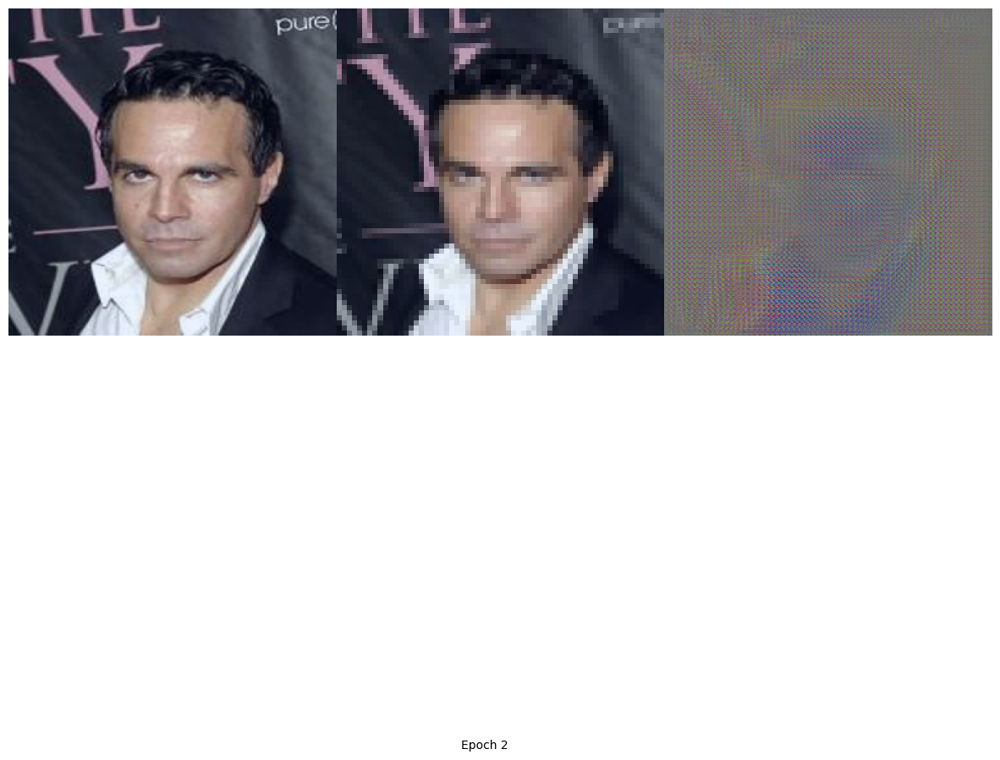

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


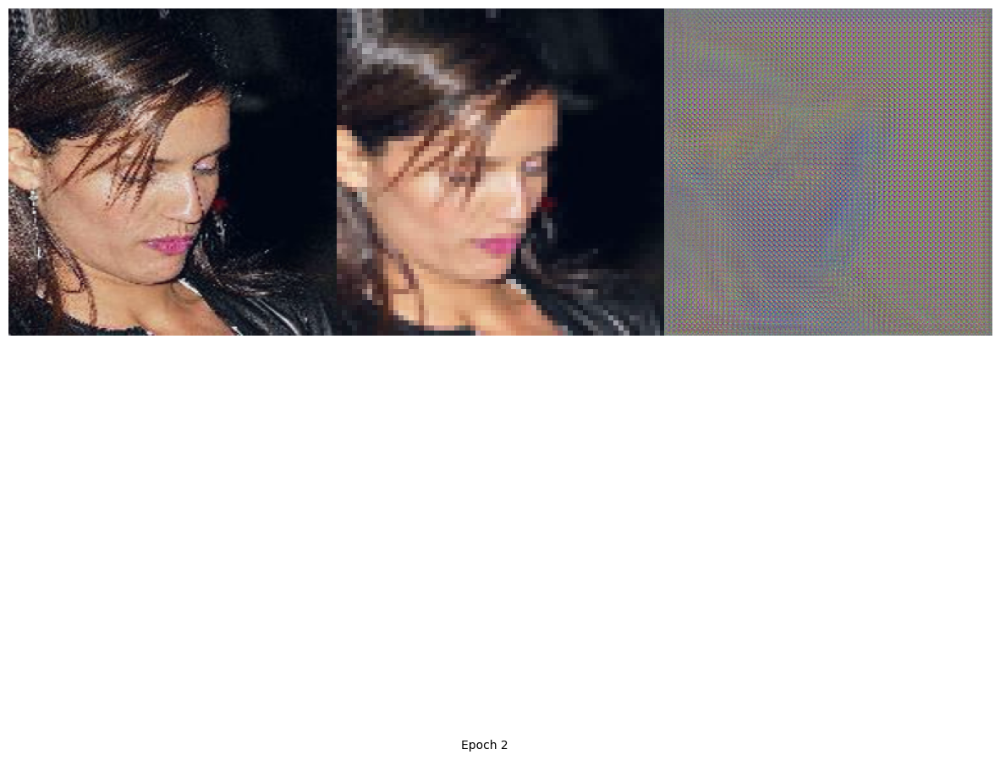

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


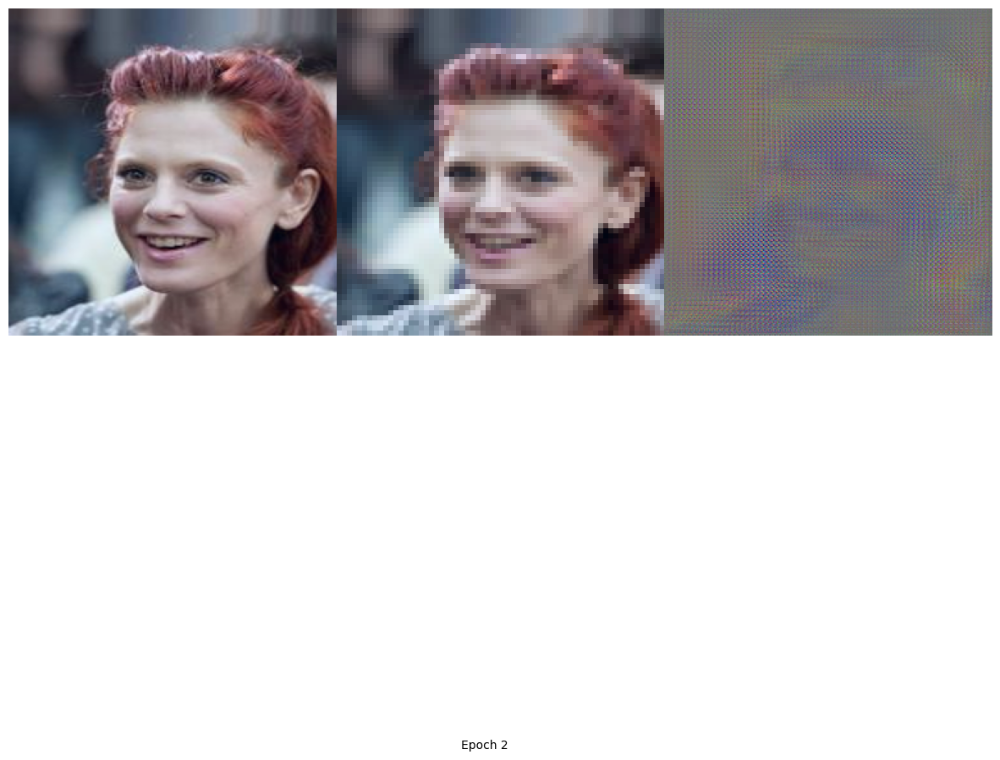

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


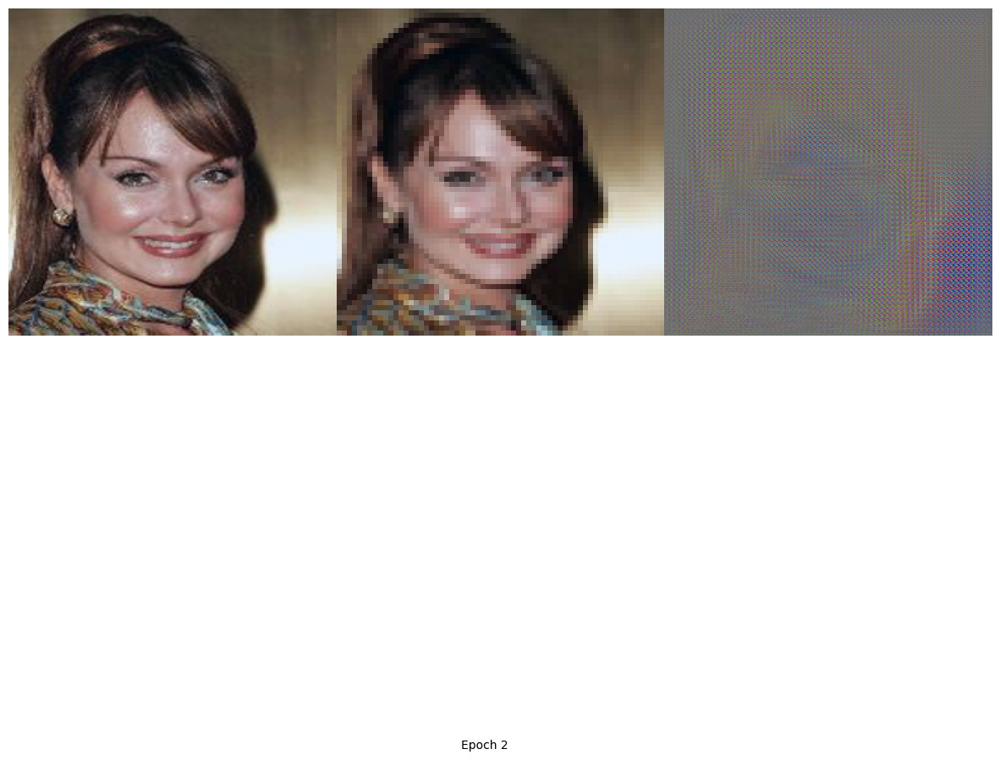

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


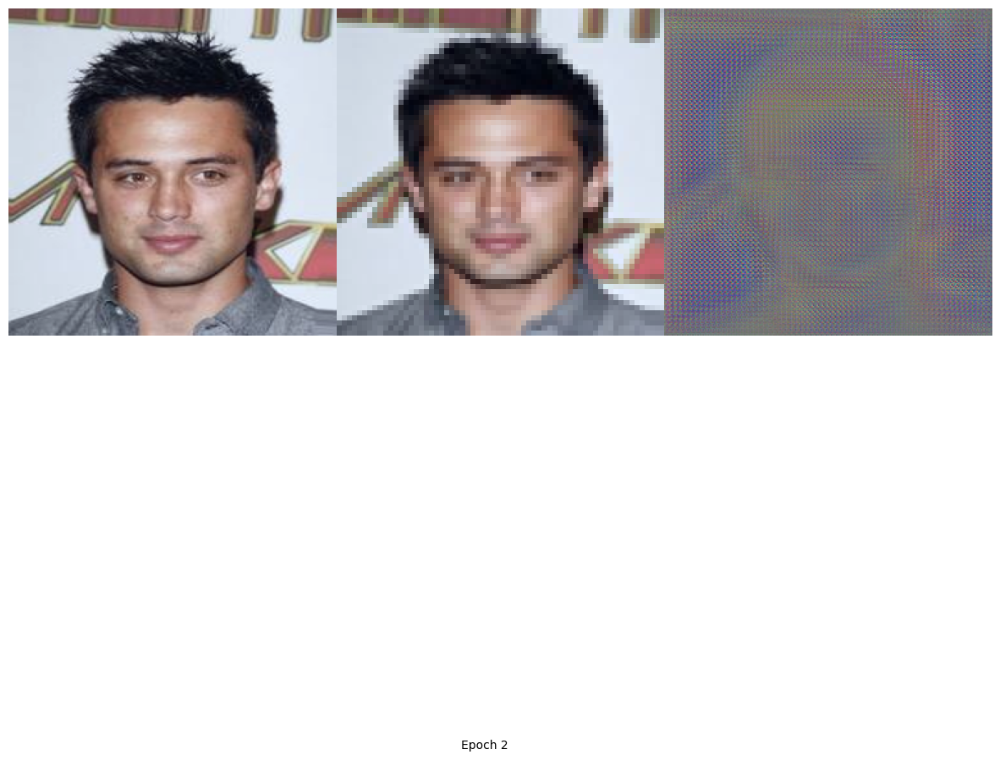

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


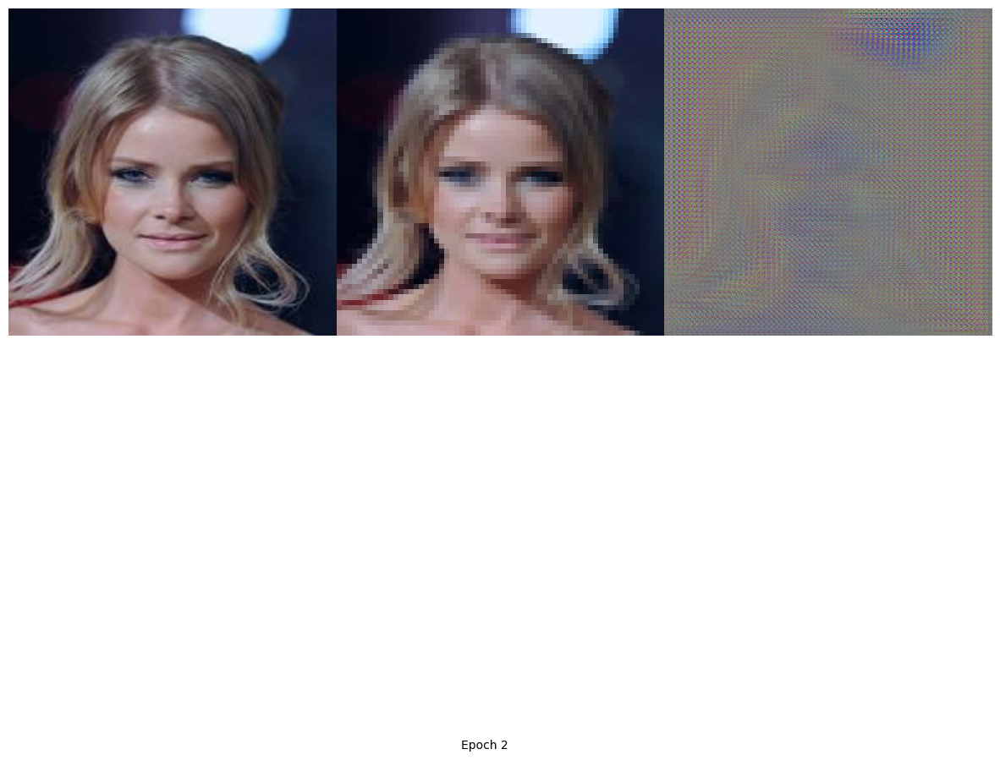

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


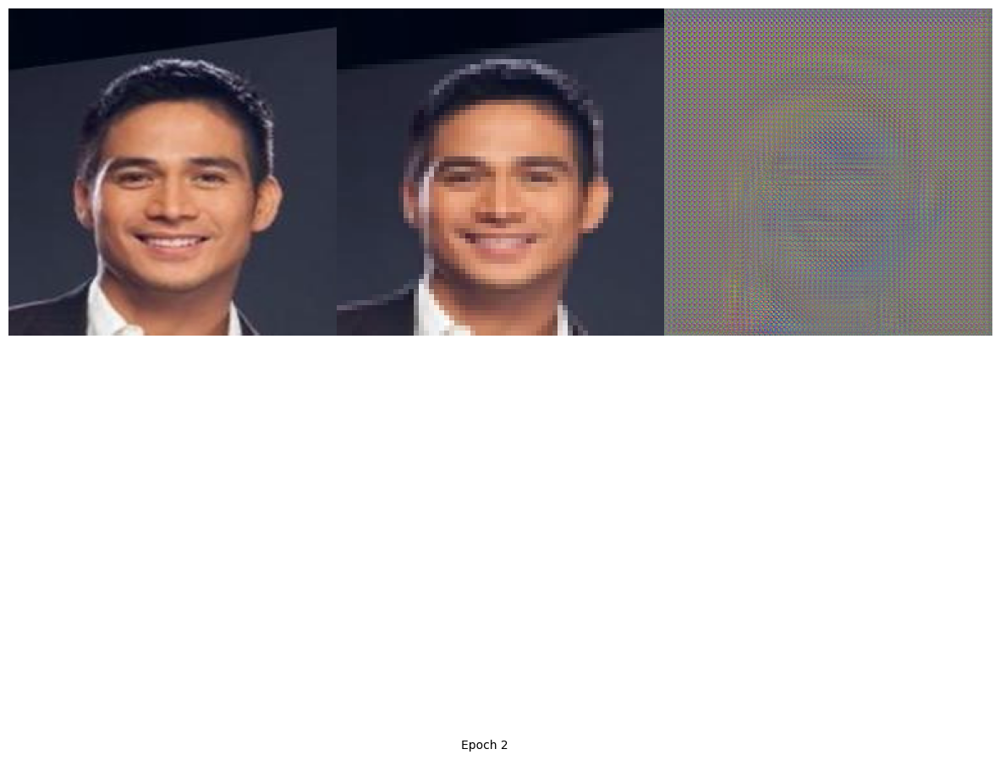

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


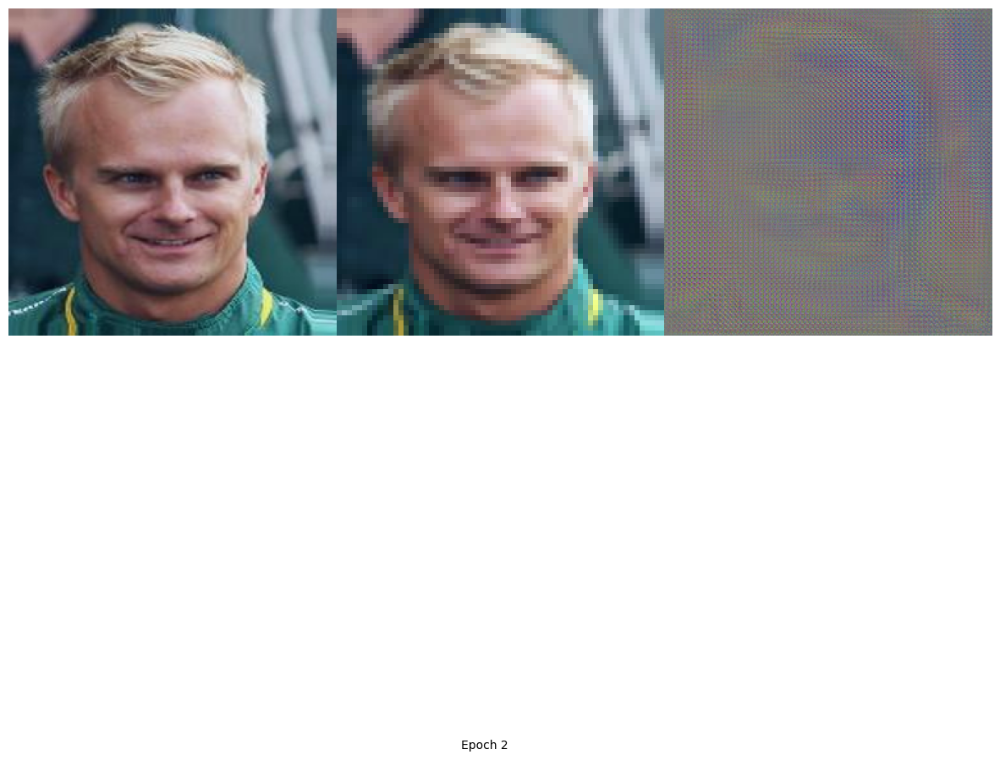

(3, 256, 256)
(3, 64, 64)
(3, 256, 256)


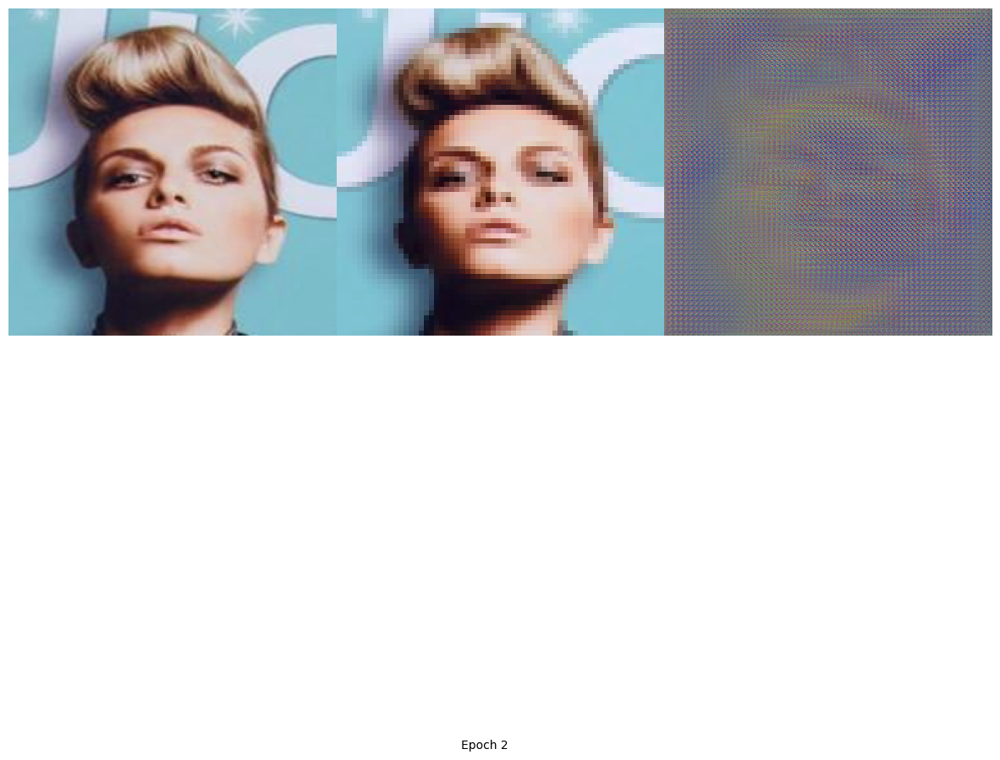

Training Epoch 1 :   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
def plot_train_result(real_image, gen_image, recon_image, epoch=1, save=False,  show=True, fig_size=(15, 15)):
    fig, axes = plt.subplots(1, 3, figsize=fig_size)
    imgs = [to_np(real_image), to_np(gen_image), to_np(recon_image),
            to_np(real_image), to_np(gen_image), to_np(recon_image)]
    for ax, img in zip(axes.flatten(), imgs):
        ax.axis('off')
        #ax.set_adjustable('box-forced')
        # Scale to 0-255
        img = img.squeeze()
        print(img.shape)
#         img = img.reshape(3, 256, 256)
        img = (((img - img.min()) * 255) / (img.max() - img.min())).transpose(1, 2, 0).astype(np.uint8)
        ax.imshow(img, cmap=None, aspect='equal')
    plt.subplots_adjust(wspace=0, hspace=0)

    title = 'Epoch {0}'.format(epoch + 1)
    fig.text(0.5, 0.04, title, ha='center')

    # save figure
    if save:
        save_fn = 'Result_epoch_{:d}'.format(epoch+1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()
def to_np(x):
    return x.data.cpu().numpy()
def calculate_psnr(original, enhanced):
    # Ensure the images have the same data type
    original = original.astype(np.float64)
    enhanced = enhanced.astype(np.float64)

    # Calculate the mean squared error (MSE)
    mse = np.mean((original - enhanced) ** 2)

    # Calculate the maximum possible pixel value
    max_pixel_value = np.max(original)

    # Calculate the PSNR using the formula: PSNR = 20 * log10(MAX) - 10 * log10(MSE)
    psnr = 20 * np.log10(max_pixel_value) - 10 * np.log10(mse)

    return psnr
def calculate_ssim(hr_image, sr_image):
    c1 = 0.01 ** 2  # Constant for numerical stability
    c2 = 0.03 ** 2  # Constant for numerical stability

    # Compute mean of input images
    mu_hr = torch.mean(hr_image)
    mu_sr = torch.mean(sr_image)

    # Compute variance of input images
    var_hr = torch.var(hr_image)
    var_sr = torch.var(sr_image)

    # Compute covariance
    cov = torch.mean((hr_image - mu_hr) * (sr_image - mu_sr))

    # Compute SSIM
    numerator = (2 * mu_hr * mu_sr + c1) * (2 * cov + c2)
    denominator = (mu_hr ** 2 + mu_sr ** 2 + c1) * (var_hr + var_sr + c2)
    ssim = numerator / denominator

    return ssim
train_gen_losses, train_disc_losses, train_counter = [], [], []
test_gen_losses, test_disc_losses = [], []
test_counter = [idx*len(train_dataloader.dataset) for idx in range(1, n_epochs+1)]

for epoch in range(n_epochs):
    count = 0
    ### Training
    gen_loss, disc_loss = 0, 0
    tqdm_bar = tqdm(train_dataloader, desc=f'Training Epoch {epoch} ', total=int(len(train_dataloader)))
    for batch_idx, imgs in enumerate(tqdm_bar):
        generator.train(); discriminator.train()
        # Configure model input
        imgs_lr = Variable(imgs["lr"].type(Tensor))
        imgs_hr = Variable(imgs["hr"].type(Tensor))
        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((imgs_lr.size(0), *discriminator.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((imgs_lr.size(0), *discriminator.output_shape))), requires_grad=False)

        ### Train Generator
        optimizer_G.zero_grad()
        # Generate a high resolution image from low resolution input
        gen_hr = generator(imgs_lr)
        # Adversarial loss
        loss_GAN = criterion_GAN(discriminator(gen_hr), valid)
        # Content loss
        gen_features = feature_extractor(gen_hr)
        real_features = feature_extractor(imgs_hr)
        loss_content = criterion_content(gen_features, real_features.detach())
        # Total loss
        loss_G = loss_content + 1e-3 * loss_GAN
        loss_G.backward()
        optimizer_G.step()

        ### Train Discriminator
        optimizer_D.zero_grad()
        # Loss of real and fake images
        loss_real = criterion_GAN(discriminator(imgs_hr), valid)
        loss_fake = criterion_GAN(discriminator(gen_hr.detach()), fake)
        # Total loss
        loss_D = (loss_real + loss_fake) / 2
        loss_D.backward()
        optimizer_D.step()

        gen_loss += loss_G.item()
        train_gen_losses.append(loss_G.item())
        disc_loss += loss_D.item()
        train_disc_losses.append(loss_D.item())
        train_counter.append(batch_idx*batch_size + imgs_lr.size(0) + epoch*len(train_dataloader.dataset))
        tqdm_bar.set_postfix(gen_loss=gen_loss/(batch_idx+1), disc_loss=disc_loss/(batch_idx+1))

    # Testing
    gen_loss, disc_loss = 0, 0
    tqdm_bar = tqdm(test_dataloader, desc=f'Testing Epoch {epoch} ', total=int(len(test_dataloader)))
    for batch_idx, imgs in enumerate(tqdm_bar):
        generator.eval(); discriminator.eval()
        # Configure model input
        imgs_lr = Variable(imgs["lr"].type(Tensor))
        imgs_hr = Variable(imgs["hr"].type(Tensor))
        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((imgs_lr.size(0), *discriminator.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((imgs_lr.size(0), *discriminator.output_shape))), requires_grad=False)

        ### Eval Generator
        # Generate a high resolution image from low resolution input
        gen_hr = generator(imgs_lr)
        # Adversarial loss
        loss_GAN = criterion_GAN(discriminator(gen_hr), valid)
        # Content loss
        gen_features = feature_extractor(gen_hr)
        real_features = feature_extractor(imgs_hr)
        loss_content = criterion_content(gen_features, real_features.detach())
        # Total loss
        loss_G = loss_content + 1e-3 * loss_GAN

        if(count%9000 == 0):
            print("HR shape",imgs_hr.shape)
            print("LR shape",imgs_lr.shape)
            print("G shape",gen_hr.shape)
            for k in range(imgs_hr.shape[0]):
                plot_train_result(imgs_hr[k,:,:,:], imgs_lr[k,:,:,:], gen_hr[k,:,:,:])

        count = count+1

        ### Eval Discriminator
        # Loss of real and fake images
        loss_real = criterion_GAN(discriminator(imgs_hr), valid)
        loss_fake = criterion_GAN(discriminator(gen_hr.detach()), fake)
        # Total loss
        loss_D = (loss_real + loss_fake) / 2

        gen_loss += loss_G.item()
        disc_loss += loss_D.item()
        tqdm_bar.set_postfix(gen_loss=gen_loss/(batch_idx+1), disc_loss=disc_loss/(batch_idx+1))

        # Save image grid with upsampled inputs and SRGAN outputs
        if random.uniform(0,1)<0.1:
            imgs_lr = nn.functional.interpolate(imgs_lr, scale_factor=4)
            imgs_hr = make_grid(imgs_hr, nrow=1, normalize=True)
            gen_hr = make_grid(gen_hr, nrow=1, normalize=True)
            imgs_lr = make_grid(imgs_lr, nrow=1, normalize=True)
            img_grid = torch.cat((imgs_hr, imgs_lr, gen_hr), -1)
            save_image(img_grid, f"images/{batch_idx}.png", normalize=False)

    test_gen_losses.append(gen_loss/len(test_dataloader))
    test_disc_losses.append(disc_loss/len(test_dataloader))
